# **1. Введение**

## **1.1. Тема исследования**

Анализ клиентского поведения и сегментация клиентов компании на основе маркетинговых и социально-демографических данных.

## **1.2. Цели исследования**

* Изучить взаимосвязи между социально-демографическими характеристиками клиентов и их покупательским поведением.
* Проверить гипотезы о факторах, влияющих на покупательское поведение и маркетинговую активность.
* Провести сегментацию клиентов с помощью кластеризации и создать профили клиентов.

## **1.3. Задачи исследования**

Для достижения целей исследования сформулируем следующие задачи:  
1. Выполнить предварительную обработку данных.
2. Провести исследовательский анализ данных (EDA).
3. Исследовать корреляционные связи между признаками.
4. Проверить статистические гипотезы.
5. Выполнить кластеризацию клиентов.
6. Интерпретировать полученные результаты.

## **1.4. Значимость исследования**

Результаты исследования позволят:

* Улучшить понимание клиентской базы компании.
* Разработать персонализированные маркетинговые стратегии.
* Повысить эффективность маркетинговых кампаний.
* Оптимизировать взаимодействие с различными сегментами клиентов.

---

# **2. Описание данных**

## **2.1. Выбор датасета**

Для исследования был выбран датасет **Customer Personality Analysis**, предоставленный на платформе Kaggle.

## **2.2. Описание датасета**

Датасет содержит подробную информацию о клиентах компании, их покупательском поведении и взаимодействии с маркетинговыми кампаниями. Он состоит из 29 признаков, которые охватывают следующие аспекты:  

1. **Социально-демографические характеристики:**  
   - `ID` — уникальный идентификатор клиента.  
   - `Year_Birth` — год рождения клиента.  
   - `Education` — уровень образования.  
   - `Marital_Status` — семейное положение.  
   - `Income` — годовой доход домохозяйства.  
   - `Kidhome` и `Teenhome` — количество детей и подростков в домохозяйстве соответственно.  
   - `Dt_Customer` — дата регистрации клиента.  
   - `Recency` — количество дней с момента последней покупки.  
   - `Complain` — жаловался ли клиент за последние 2 года.  

2. **Данные о покупках:**  
   - `MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProds` — затраты на различные категории товаров за последние 2 года.  

3. **Маркетинговая активность:**  
   - `NumDealsPurchases` — количество покупок со скидкой.  
   - `AcceptedCmp1–5` — участие в маркетинговых кампаниях.  
   - `Response` — факт отклика на последнюю маркетинговую кампанию.  

4. **Поведение в каналах продаж:**  
   - `NumWebPurchases`, `NumCatalogPurchases`, `NumStorePurchases` — количество покупок через сайт, каталог или в магазине.  
   - `NumWebVisitsMonth` — количество посещений сайта за последний месяц.

Сделаем необходимые импорты и загрузим датасет:

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
from sklearn.neighbors import NearestNeighbors 
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
!pip install skimpy
from skimpy import skim
import warnings
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from scipy.stats import f_oneway

# отключаем FutureWarning
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.8/28.8 MB 59.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 46.7 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.3.0
    Uninstalling typeguard-4.3.0:
      Successfully uninstalled typeguard-4.3.0
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: polars
    Found existing installation: polars 1.15.0
    Uninstalling polars-1.15.0:
      Successfully uninstalled polars-1.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
apache-beam 2.46.0 requires cloudpickle~=2.2.1, but you have cloudpickle 3.1.0 which is incompatible.
apache-beam 2.46.0 requires dill<0.3.2,>=0.3.1.1, but you have di

In [3]:
data = pd.read_csv("/kaggle/input/marketing_campaign.csv", sep = '\t')
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


Теперь выведем основную информацию о датасете:

In [4]:
skim(data)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 2240   │ │ int64       │ 25    │                                                          │
│ │ Number of columns │ 29     │ │ string      │ 3     │                                                          │
│ └───────────────────┴────────┘ │ float64     │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name           ┃ NA  ┃ NA %  ┃ mean      ┃ sd      ┃ p0   ┃ p25   ┃ p50   ┃ p75   ┃ p100   ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━┩  │
│ │ ID                    │   0 │     0 │      5592 │    3247 │    0 │  2828 │  5458 │  8428 │  11190 │ ▇▇▇▇▆▇ │  │
│ │ Year_Birth            │   0 │     0 │      1969 │   11.98 │ 1893 │  1959 │  1970 │  1977 │   1996 │    ▅▇▃ │  │
│ │ Income                │  24 │  1.07 │     52250 │   25170 │ 1730 │ 35300 │ 51380 │ 68520 │ 666700 │   ▇    │  │
│ │ Kidhome               │   0 │     0 │    0.4442 │  0.5384 │    0 │     0 │     0 │     1 │      2 │  ▇  ▆  │  │
│ │ Teenhome              │   0 │     0 │    0.5062 │  0.5445 │    0 │     0 │     0 │     1 │      2 │  ▇  ▇  │  │
│ │ Recency               │   0 │     0 │     49.11 │   28.96 │    0 │    24 │    49 │    74 │     99 │ ▇▇▇▇▇▇ │  │
│ │ MntWines              │   0 │     0 │     303.9 │   336.6 │    0 │ 23.75 │ 173.5 │ 504.2 │   1493 │ ▇▂▂▁▁  │  │
│ │ MntFruits             │   0 │     0 │      26.3 │   39.77 │    0 │     1 │     8 │    33 │    199 │  ▇▁▁   │  │
│ │ MntMeatProducts       │   0 │     0 │     166.9 │   225.7 │    0 │    16 │    67 │   232 │   1725 │  ▇▁▁   │  │
│ │ MntFishProducts       │   0 │     0 │     37.53 │   54.63 │    0 │     3 │    12 │    50 │    259 │  ▇▁▁   │  │
│ │ MntSweetProducts      │   0 │     0 │     27.06 │   41.28 │    0 │     1 │     8 │    33 │    263 │  ▇▁▁   │  │
│ │ MntGoldProds          │   0 │     0 │     44.02 │   52.17 │    0 │     9 │    24 │    56 │    362 │  ▇▁▁   │  │
│ │ NumDealsPurchases     │   0 │     0 │     2.325 │   1.932 │    0 │     1 │     2 │     3 │     15 │  ▇▃▁   │  │
│ │ NumWebPurchases       │   0 │     0 │     4.085 │   2.779 │    0 │     2 │     4 │     6 │     27 │  ▇▃▁   │  │
│ │ NumCatalogPurchases   │   0 │     0 │     2.662 │   2.923 │    0 │     0 │     2 │     4 │     28 │   ▇▂   │  │
│ │ NumStorePurchases     │   0 │     0 │      5.79 │   3.251 │    0 │     3 │     5 │     8 │     13 │ ▂▇▃▃▂▃ │  │
│ │ NumWebVisitsMonth     │   0 │     0 │     5.317 │   2.427 │    0 │     3 │     6 │     7 │     20 │  ▅▇▇   │  │
│ │ AcceptedCmp3          │   0 │     0 │   0.07277 │  0.2598 │    0 │     0 │     0 │     0 │      1 │ ▇    ▁ │  │
│ │ AcceptedCmp4          │   0 │     0 │   0.07455 │  0.2627 │    0 │     0 │     0 │     0 │      1 │ ▇    ▁ │  │
│ │ AcceptedCmp5          │   0 │     0 │   0.07277 │  0.2598 │    0 │     0 │     0 │     0 │      1 │ ▇    ▁ │  │
│ │ AcceptedCmp1          │   0 │     0 │   0.06429 │  0.2453 │    0 │     0 │     0 │     0 │      1 │ ▇    ▁ │  │
│ │ AcceptedCmp2          │   0 │     0 │   0.01339 │   

Всего в датасете 2240 записей и 29 различных признаков. 25 из них целочисленные, ещё 3 строковые и 1 вещественный.

Также можно ознакомиться с основными статистическими характеристиками датасета и убедиться в том, что пропусков в датасете почти нет (за исключением признака `Income`, однако и там пропусков всего 1.07%).

Ещё можно заметить два странных признака `Z_CostContact` и `Z_Revenue`, у которых стандартное отклонение = 0 (то есть они для всех записей принимают единственное значение). Разберёмся с этими признаками на этапе предварительной обработки данных.

## **2.3. Причины выбора датасета**

1. **Разнообразие данных:**  
   Датасет включает социально-демографические, поведенческие и финансовые данные клиентов, что даёт возможность провести многогранный анализ.  

2. **Практическая значимость:**  
   Полученные результаты можно применить для разработки персонализированных маркетинговых стратегий.  

3. **Объем данных:**  
   Достаточный для статистически значимых выводов, но не перегруженный, что делает его удобным для обработки.

---

# **3. Предварительная обработка данных**

## **3.1. Обработка пропущенных значений**

Как мы ранее узнали, в датасете есть пропуски только в столбце `Income`, их доля составляет 1.07%. Обычно разумной практикой является замена пропусков на медианные значения признака, однако учитывая, что тут процент пропусков крайне мал, вместо этого просто удалим строки с пропусками (тем самым мы никак не ухудшим качество датасета, заменяя пропуски на ненастоящие значения, приэтом почти не потеряем в размере датасета).

In [5]:
data = data.dropna()
data

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


## **3.2. Поиск и обработка дубликатов**

Проверим, есть ли в датасете дубликаты:

In [6]:
duplicates = data.duplicated()
print(f"Количество дубликатов: {duplicates.sum()}")

Количество дубликатов: 0


Дубликатов нет, значит обрабатывать их не придётся.

## **3.3. Feature engineering**

Признаки `Year_Birth` и `Dt_Customer` могут быть не очень удобными для анализа, поэтому преобразуем их в признаки `Age` (возраст клиента на момент 14.12.2024) и `DaysPassedSinceRegistration` (количество дней, которое прошло с момента регистрации пользователя, на момент 14.12.2024).

*Важно понимать, что исходном датасете использование признаков `Age` и `DaysPassedSinceRegistration` было бы неверным, так как приходилось бы постоянно обновлять данные, но вот именно для анализа их использование оправдано.*

In [7]:
# Текущая дата
current_date = datetime(2024, 12, 14)

data['Age'] = current_date.year - data['Year_Birth']
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'], format='%d-%m-%Y')
data['DaysPassedSinceRegistration'] = (current_date - data['Dt_Customer']).dt.days

data = data.drop(columns=['Year_Birth', 'Dt_Customer'])

data.head()

,ID,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,DaysPassedSinceRegistration
0,5524,Graduation,Single,58138.0,0,0,58,635,88,546,...,0,0,0,0,0,3,11,1,67,4484
1,2174,Graduation,Single,46344.0,1,1,38,11,1,6,...,0,0,0,0,0,3,11,0,70,3934
2,4141,Graduation,Together,71613.0,0,0,26,426,49,127,...,0,0,0,0,0,3,11,0,59,4133
3,6182,Graduation,Together,26646.0,1,0,26,11,4,20,...,0,0,0,0,0,3,11,0,40,3960
4,5324,PhD,Married,58293.0,1,0,94,173,43,118,...,0,0,0,0,0,3,11,0,43,3982


Также, как было замечено ранее, в датасете есть признаки `Z_CostContact` и `Z_Revenue`, которые принимают одно и то же значение для всех записей. Проверим это:

In [8]:
print('Значения, принимаемые столбцом Z_CostContact:')
print(*data['Z_CostContact'].unique())
print('Значения, принимаемые столбцом Z_Revenue:')
print(*data['Z_Revenue'].unique())

Значения, принимаемые столбцом Z_CostContact:
3
Значения, принимаемые столбцом Z_Revenue:
11


Эти 2 столбца действительно всегда принимают одно значение, так что удалим их, так как они бесполезны для дальнейшего анализа:

In [9]:
data = data.drop(columns=['Z_CostContact', 'Z_Revenue'])

Также для анализа бесполезен признак `ID` (ведь это просто идентификатор клиента), так что удалим и его:

In [10]:
data = data.drop(columns=['ID'])

## **3.4. Работа с выбросами**

С помощью ящиков с усами проверим, есть ли выбросы в датасете:

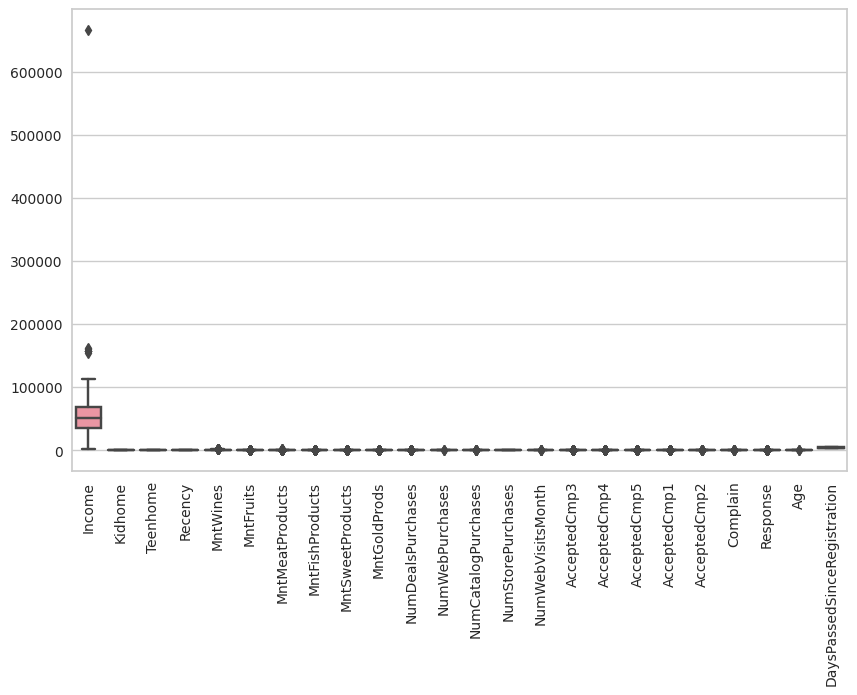

In [11]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=data)
plt.xticks(rotation=90)
plt.show()

Видим, что выбросы есть по многим признакам.

Проверим количество выбросов по каждому признаку, в котором они есть, чтобы определить, что делать с ними дальше:

In [12]:
features_with_outliers = ['Income', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
                         'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumWebVisitsMonth', 'AcceptedCmp1', 'AcceptedCmp2',
                         'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain', 'Response', 'Age']

for feature in features_with_outliers:
    # Рассчитываем квартильные значения
    Q1 = data[feature].quantile(0.25)  # Первый квартиль (25-й перцентиль)
    Q3 = data[feature].quantile(0.75)  # Третий квартиль (75-й перцентиль)
    IQR = Q3 - Q1  # Межквартильный размах
    
    # Определяем границы для выбросов
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Количество выбросов
    outliers = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)]
    num_outliers = outliers.shape[0]
    
    # Процент выбросов
    percent_outliers = 100 * num_outliers / data.shape[0]

    print(f'Для {feature}:')
    print(f'Количество выбросов: {num_outliers}')
    print(f'Процент выбросов: {percent_outliers:.3g}%')
    print('============')

Для Income:
Количество выбросов: 8
Процент выбросов: 0.361%
Для MntWines:
Количество выбросов: 35
Процент выбросов: 1.58%
Для MntFruits:
Количество выбросов: 246
Процент выбросов: 11.1%
Для MntMeatProducts:
Количество выбросов: 174
Процент выбросов: 7.85%
Для MntFishProducts:
Количество выбросов: 222
Процент выбросов: 10%
Для MntSweetProducts:
Количество выбросов: 246
Процент выбросов: 11.1%
Для MntGoldProds:
Количество выбросов: 205
Процент выбросов: 9.25%
Для NumDealsPurchases:
Количество выбросов: 84
Процент выбросов: 3.79%
Для NumWebPurchases:
Количество выбросов: 3
Процент выбросов: 0.135%
Для NumCatalogPurchases:
Количество выбросов: 23
Процент выбросов: 1.04%
Для NumWebVisitsMonth:
Количество выбросов: 8
Процент выбросов: 0.361%
Для AcceptedCmp1:
Количество выбросов: 142
Процент выбросов: 6.41%
Для AcceptedCmp2:
Количество выбросов: 30
Процент выбросов: 1.35%
Для AcceptedCmp3:
Количество выбросов: 163
Процент выбросов: 7.36%
Для AcceptedCmp4:
Количество выбросов: 164
Процент выб

В итоге, мы точно знаем, что выбросы в данных являются корректными и отражают реальное поведение клиентов (так как сам датасет не содержит ошибочных данных). При этом для некоторых признаков процент выбросов достигает значительных значений (до 15%, как в случае с Response), что указывает на то, что они не являются редкими аномалиями, а представляют важные паттерны в данных. Их удаление может привести к потере ценной информации, особенно для признаков, связанных с покупками и откликами на маркетинговые кампании, где выбросы могут указывать на активных, высокодоходных или уникальных клиентов.

Поэтому оставим выбросы в данных, чтобы сохранить полную структуру данных и обеспечить максимально точный и достоверный анализ.

## **3.5. Кодирование категориальных признаков**

В этом датасете из всех признаков категориальными являются только `Education` и `Marital_Status`. Посмотрим, на категории и количества записей для этих признаков:

In [13]:
# Для Education
print('Категории и количество записей для признака Education:')
education_counts = data['Education'].value_counts()
print(education_counts)
print('\n')

# Для Marital_Status
print('Категории и количество записей для признака Marital_Status:')
marital_status_counts = data['Marital_Status'].value_counts()
print(marital_status_counts)

Категории и количество записей для признака Education:
Education
Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: count, dtype: int64


Категории и количество записей для признака Marital_Status:
Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64


Для начала закодируем значения признака `Education`. Так как уровни образования последовательны (Basic -> Graduation -> Master -> PhD), то чтобы сохранить эту логику, попробуем закодировать их последовательными числами 0, 1, 2, 3 соответственно. При этом уровень образования 2n Cycle не входит в эту логическую последовательность уровней образования, а находится вне её, так как это второе образование. Поэтому можно закодировать именно этот уровень с помощью One-Hot Encoding (а в исходном столбце будем кодировать его значением -1; хоть это и не является "естественным" представлением, но так как у нас будет отдельный признак `2n_Cycle_flag`, то так можно сделать). Таким образом мы сможем оптимально закодировать значения признака `Education`:

In [14]:
# Числовая кодировка для значений Education
education_mapping = {
    'Basic': 0,
    'Graduation': 1,
    'Master': 2,
    'PhD': 3
}

# Применяем числовую кодировку, где не '2n Cycle'
data['Education_encoded'] = data['Education'].map(education_mapping)

# One-Hot encoding для '2n Cycle'
data['2n_Cycle_flag'] = (data['Education'] == '2n Cycle').astype(int)

# Заменяем пропуски в Education_encoded (где был '2n Cycle') на -1
data['Education_encoded'] = data['Education_encoded'].fillna(-1)

# Проверка результатов
print(data[['Education', 'Education_encoded', '2n_Cycle_flag']].sample(10))

       Education  Education_encoded  2n_Cycle_flag
2029    2n Cycle               -1.0              1
166   Graduation                1.0              0
93        Master                2.0              0
1967  Graduation                1.0              0
1261         PhD                3.0              0
144   Graduation                1.0              0
835   Graduation                1.0              0
1201  Graduation                1.0              0
466          PhD                3.0              0
357          PhD                3.0              0


In [15]:
data = data.drop(columns=['Education'])

Далее закодируем значения признака `Marital_Status`. Их нельзя как-то естественно упорядочить, поэтому просто используем One-Hot Encoding, при этом очень редкие (и не очень понятные по смыслу) категории Alone, Absurd и YOLO объединим в одну категорию Other: 

In [16]:
# Объединение редких категорий
data['Marital_Status'] = data['Marital_Status'].replace({'Alone': 'Other', 'Absurd': 'Other', 'YOLO': 'Other'})

# One-Hot Encoding
data = pd.get_dummies(data, columns=['Marital_Status'], prefix='Marital_Status')

new_columns = [col for col in data.columns if col.startswith('Marital_Status_')]
data[new_columns] = data[new_columns].astype(int)

In [17]:
data.sample(5)

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Age,DaysPassedSinceRegistration,Education_encoded,2n_Cycle_flag,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Other,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
108,38557.0,1,0,17,76,3,31,4,4,27,...,46,4378,1.0,0,0,0,0,1,0,0
2163,74859.0,0,0,63,570,73,614,133,102,73,...,75,4212,-1.0,1,0,0,0,0,0,1
1304,71626.0,0,0,94,546,72,376,94,145,72,...,45,4426,1.0,0,0,1,0,0,0,0
1726,42586.0,1,1,7,194,2,56,0,0,0,...,69,4429,1.0,0,0,0,0,0,1,0
31,38620.0,0,0,56,112,17,44,34,22,89,...,61,4235,2.0,0,0,0,0,0,1,0


---

# **4. Исследовательский анализ данных (EDA)**

## **4.1. Анализ распределений признаков**

Уже были построены ящики с усами для признаков, а также были проверены основные статистические характеристики. Сейчас же построим гистограммы и графики распределений для каждого признака:

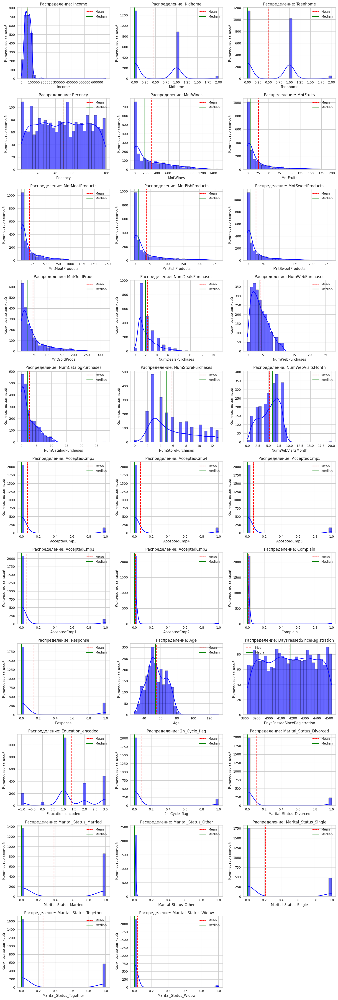

In [18]:
numerical_columns = data.select_dtypes(include='number').columns  # Выбор числовых признаков (на данный момент это все признаки)

# Определяем количество строк и столбцов для сетки графиков
n_cols = 3  # Количество графиков в одной строке
n_rows = -(-len(numerical_columns) // n_cols)  # Вычисляем количество строк (с округлением вверх)

# Создаем холст для всех графиков
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))  
axes = axes.flatten()  

# Построение графиков
for i, column in enumerate(numerical_columns):
    ax = axes[i]
    sns.histplot(data[column], kde=True, bins=30, color="blue", alpha=0.6, stat="count", ax=ax)
    ax.axvline(data[column].mean(), color='red', linestyle='--', label='Mean')  # Линия среднего
    ax.axvline(data[column].median(), color='green', linestyle='-', label='Median')  # Линия медианы
    ax.set_title(f"Распределение: {column}")
    ax.set_xlabel(column)
    ax.set_ylabel("Количество записей")
    ax.legend()

# Удаление пустых графиков, если колонок меньше, чем ячеек
for j in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


С помощью графиков можно исследовать распределения различных признаков.

## **4.2. Корреляционный анализ**

Теперь построим тепловую карту корреляций, чтобы выделить признаки с сильной и слабой корреляцией:

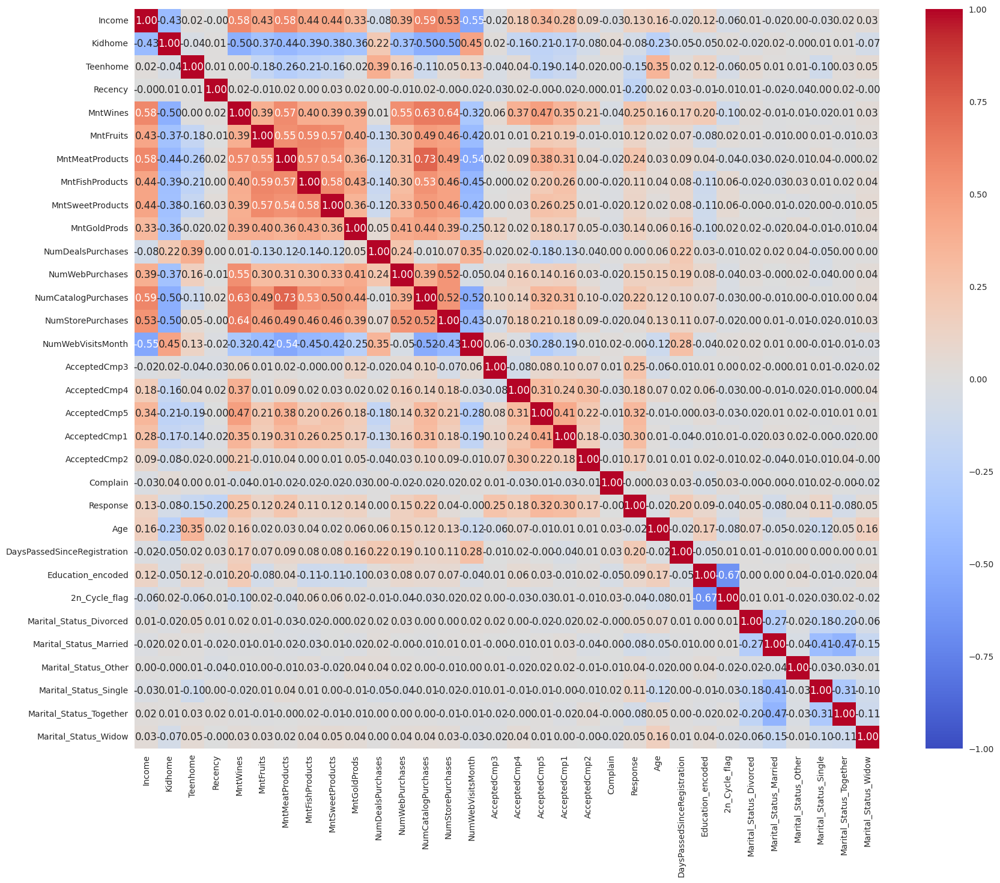

In [19]:
# Расчет корреляционной матрицы
corr_matrix = data.corr()

# Построение тепловой карты
plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, cbar=True)
plt.show()

Можно заметить множество признаков с высокой положительной и отрицательной корреляцией. Иногда это можно объяснить тем, как мы преобразовывали данные (к примеру, созданные нами признаки `Education_encoded` и `2n_Cycle_flag` имеют высокую отрицательную корреляцию в -0.67 из-за того, как мы их закодировали), а иногда существующими зависимостями в данных (например, `NumWebVisitsMonth` и `Age` имеют достаточно высокую отрицательную корреляцию в -0.65, что логично, так как более пожилые люди в среднем реже используют интернет).



## **4.3. Групповой анализ**

### **4.3.1. Анализ дохода по семейному положению**

Проверим, как семейное положение (`Martial_Status_*`) влияет на уровень дохода (`Income`):

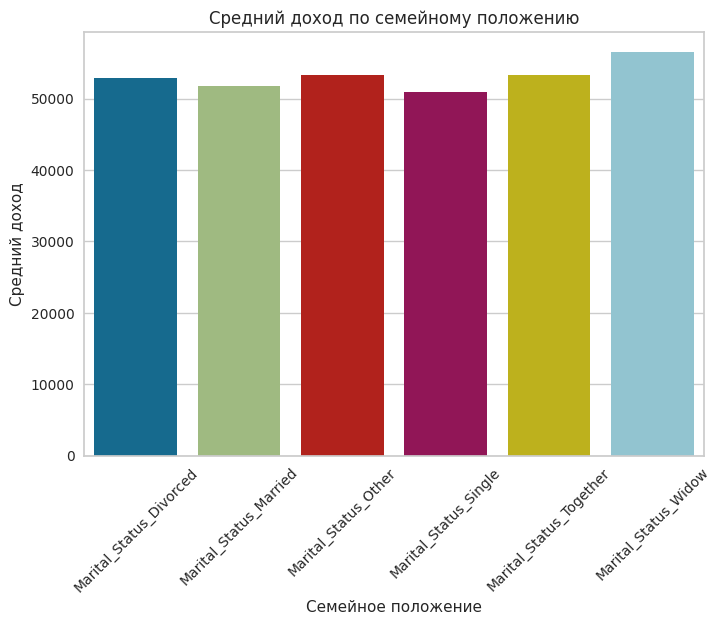

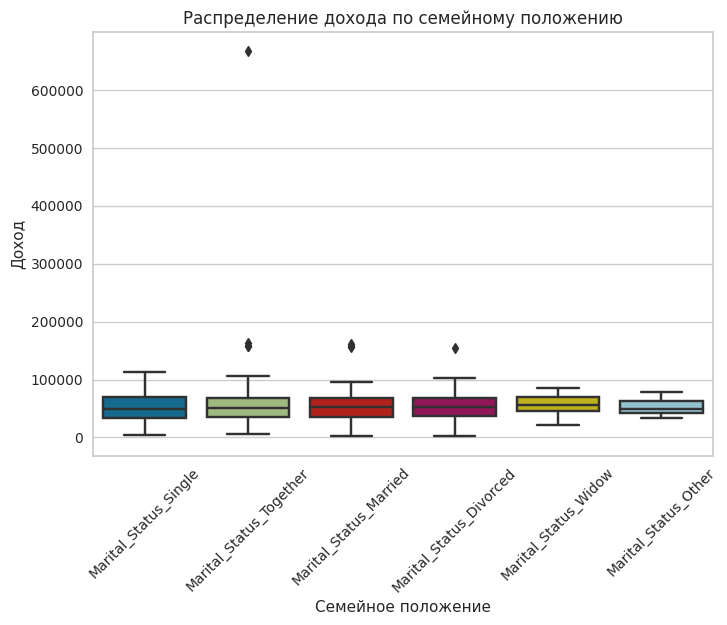

In [20]:
# Поиск категории семейного положения для каждой записи
marital_status_columns = ['Marital_Status_Divorced', 'Marital_Status_Married', 
                           'Marital_Status_Other', 'Marital_Status_Single', 
                           'Marital_Status_Together', 'Marital_Status_Widow']
data['Marital_Status'] = data[marital_status_columns].idxmax(axis=1)

# Группировка и расчет среднего дохода
income_by_marital_status = data.groupby('Marital_Status')['Income'].mean()

# Построение гистограммы 
sns.barplot(x=income_by_marital_status.index, y=income_by_marital_status.values)
plt.title('Средний доход по семейному положению')
plt.ylabel('Средний доход')
plt.xlabel('Семейное положение')
plt.xticks(rotation=45)
plt.show()

# Построение ящика с усами
sns.boxplot(data=data, x='Marital_Status', y='Income')
plt.title('Распределение дохода по семейному положению')
plt.ylabel('Доход')
plt.xlabel('Семейное положение')
plt.xticks(rotation=45)
plt.show()

# Удаляем промежуточный признак
data.drop(columns=['Marital_Status'], inplace=True)

Исходя из этого можно сделать вывод, что семейное положение сильно не влияет на уровень доходов. Для каждой из шести групп средний доход сопоставимый.

### **4.3.2. Анализ расходов на продукты и доходов**

Проверим, как общее количество детей (то есть сумма признаков `Kidhome` и `Teenhome`) влияет на затраты на различные продукты (то есть сумма признаков `MntWines`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntGoldProds`) и на средние доходы:

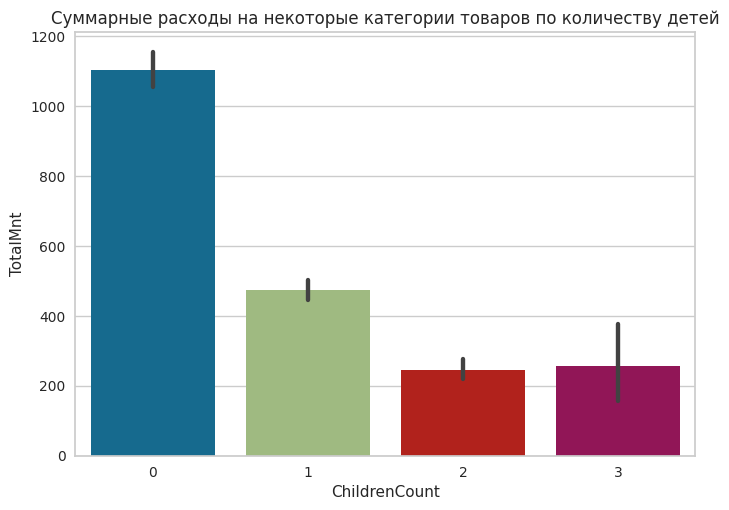

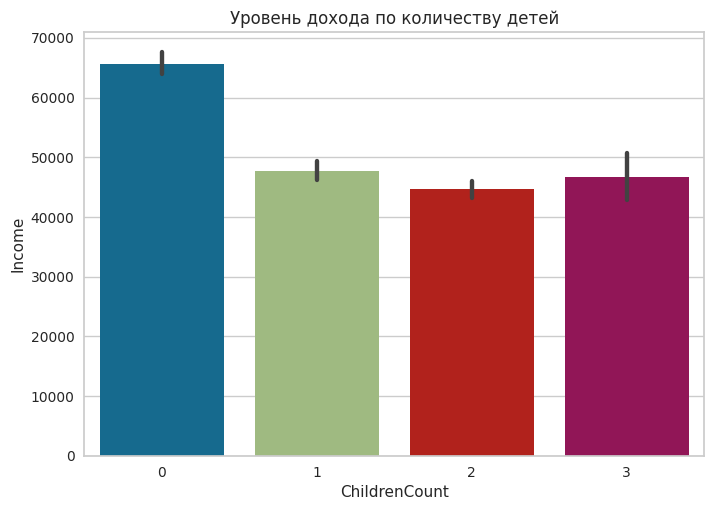

In [21]:
# Общая сумма расходов
data['TotalMnt'] = data[['MntWines', 'MntFruits', 'MntMeatProducts', 
                         'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']].sum(axis=1)

# Общее количество детей в домохозяйстве
data['ChildrenCount'] = data[['Kidhome', 'Teenhome']].sum(axis=1)

# Группировка по числу детей
total_mnt_by_kidhome = data.groupby('ChildrenCount')['TotalMnt'].mean()

# Визуализация
sns.barplot(data=data, x='ChildrenCount', y='TotalMnt')
plt.title('Суммарные расходы на некоторые категории товаров по количеству детей')
plt.show()

# Средние доходы по количеству детей
income_expense_by_children = data.groupby('ChildrenCount')[['Income']].mean()

# Визуализация
sns.barplot(data=data, x='ChildrenCount', y='Income')
plt.title('Уровень дохода по количеству детей')
plt.show()

# Удаляем промежуточные признаки
data.drop(columns=['TotalMnt', 'ChildrenCount'], inplace=True)

Можно сделать вывод, что в среднем в домохозяйствах с более высокими доходами меньше детей, а также в среднем домохозяйства с меньшим количеством детей тратят больше денег на такие категории товаров, как вина, фрукты, мясные продукты, рыбные продукты, сладости, изделия из золота. Исключением из этого правила являются домохозяйства с 2 и 3 детьми. Для них показатели очень близки, однако они выбиваются из вышеозвученной закономерности.

### **4.3.3. Анализ жалоб**

Теперь проверим, какие клиенты чаще оставляют жалобы. Построим гистограммы коэффициентов жалоб в зависимости от возраста (`Age`) и дохода (`Income`):

*Коэффициент жалоб вычисляется как количество жалоб от группы / количество людей в группе*

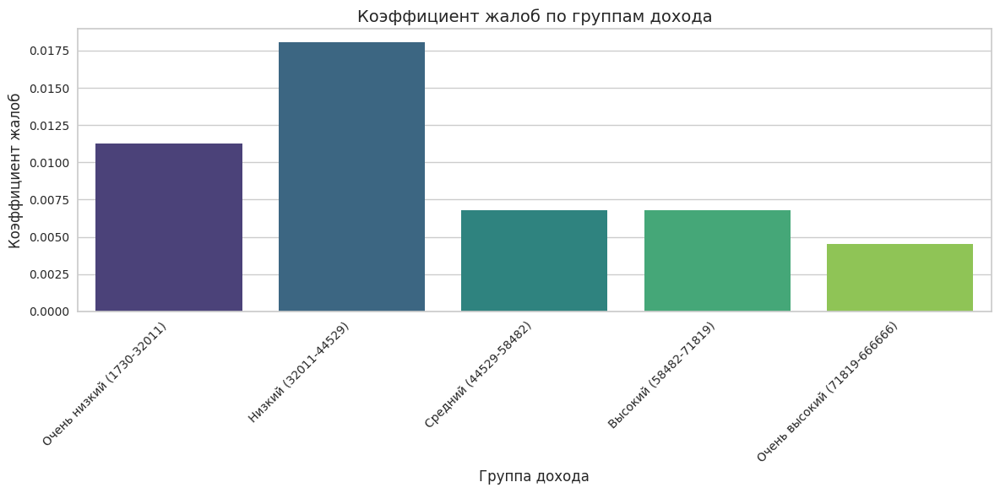

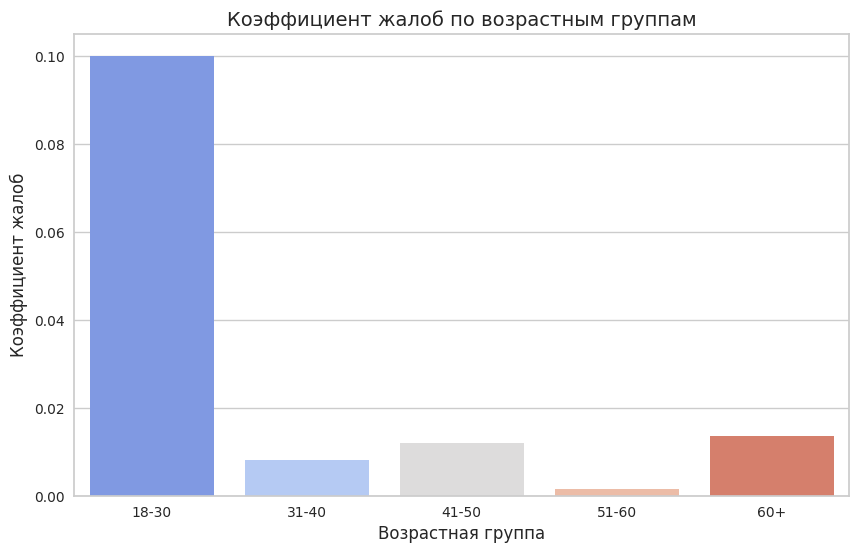

In [22]:
# Создаем квартильные группы по доходу
income_quartiles = pd.qcut(data['Income'], q=5, labels=False, retbins=True)
quartile_labels = [
    f'Очень низкий ({income_quartiles[1][0]:.0f}-{income_quartiles[1][1]:.0f})', 
    f'Низкий ({income_quartiles[1][1]:.0f}-{income_quartiles[1][2]:.0f})', 
    f'Средний ({income_quartiles[1][2]:.0f}-{income_quartiles[1][3]:.0f})', 
    f'Высокий ({income_quartiles[1][3]:.0f}-{income_quartiles[1][4]:.0f})',
    f'Очень высокий ({income_quartiles[1][4]:.0f}-{income_quartiles[1][5]:.0f})'
]

data['IncomeGroup'] = pd.qcut(data['Income'], q=5, labels=quartile_labels)

# Пересчитываем количество жалоб и пользователей в каждой группе
complain_analysis = (
    data.groupby('IncomeGroup', observed=True)
    .agg(
        TotalUsers=('Complain', 'count'),  
        ComplainCount=('Complain', 'sum'), 
    )
    .reset_index()
)

# Рассчитываем коэффициент жалоб для каждой группы
complain_analysis['ComplainRate'] = complain_analysis['ComplainCount'] / complain_analysis['TotalUsers']

# Визуализация
plt.figure(figsize=(12, 6))
sns.barplot(data=complain_analysis, x='IncomeGroup', y='ComplainRate', palette='viridis')
plt.title('Коэффициент жалоб по группам дохода', fontsize=14)
plt.xlabel('Группа дохода', fontsize=12)
plt.ylabel('Коэффициент жалоб', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Создаём группы по возрастам
data['AgeGroup'] = pd.cut(
    data['Age'], 
    bins=[18, 30, 40, 50, 60, 150],  # рассматриваем от 18, т.к. клиентов младше 18 в датасете нет
    labels=['18-30', '31-40', '41-50', '51-60', '60+']  # тут верхние границы интервалов не включаются
)

# Пересчитываем количество жалоб и пользователей в каждой возрастной группе
complain_by_age = (
    data.groupby('AgeGroup', observed=True)
    .agg(
        TotalUsers=('Complain', 'count'), 
        ComplainCount=('Complain', 'sum'),  
    )
    .reset_index()
)

# Рассчитываем коэффициент жалоб для каждой группы
complain_by_age['ComplainRate'] = complain_by_age['ComplainCount'] / complain_by_age['TotalUsers']

# Визуализация
plt.figure(figsize=(10, 6))
sns.barplot(data=complain_by_age, x='AgeGroup', y='ComplainRate', palette='coolwarm')
plt.title('Коэффициент жалоб по возрастным группам', fontsize=14)
plt.xlabel('Возрастная группа', fontsize=12)
plt.ylabel('Коэффициент жалоб', fontsize=12)
plt.show()

# Удаляем промежуточные признаки
data.drop(columns=['AgeGroup', 'IncomeGroup'], inplace=True)


Можно увидеть, какие группы клиентов чаще жалуются. 

* Зависимость от дохода следующая: чем выше доход, тем реже люди жалуются, но при этом люди с низким доходом жалуются чаще, чем люди с очень низким доходом.
* Зависимость от возраста: молодые люди (в возрасте от 18 до 30 лет) жалуются во много раз чаще, чем люди из любой другой группы.

## **4.4. Проверка гипотез**

### **4.4.1. Гипотеза 1: Уровень дохода влияет на количество покупок через интернет**

**Формулировка гипотезы:**  
**H₀**: Уровень дохода клиента не влияет на количество покупок, сделанных через интернет.  
**H₁**: Клиенты с более высоким доходом совершают больше покупок через интернет.

Для проверки этой гипотезы используем корреляцию Пирсона между признаками `Income` и `NumWebPurchases`:  

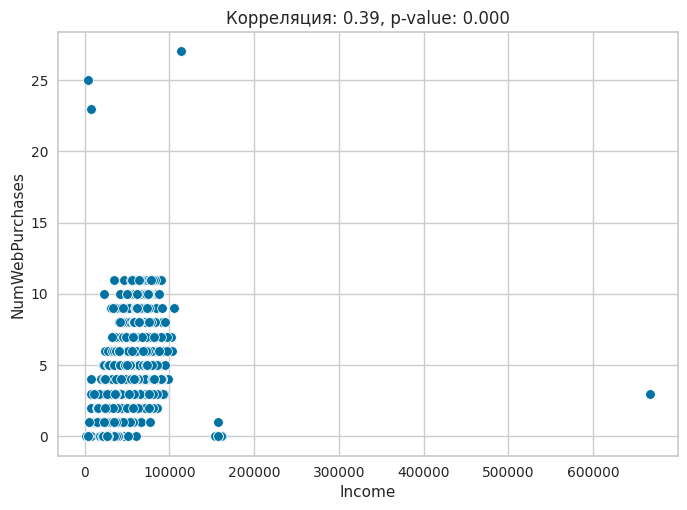

Корреляция: 0.39
P-value: 0.000


In [23]:
# Проверим корреляцию между 'Income' и 'NumWebPurchases'
corr, p_value = pearsonr(data['Income'], data['NumWebPurchases'])

# Визуализация
sns.scatterplot(x='Income', y='NumWebPurchases', data=data)
plt.title(f'Корреляция: {corr:.2f}, p-value: {p_value:.3f}')
plt.show()

print(f"Корреляция: {corr:.2f}")
print(f"P-value: {p_value:.3f}")

Так как полученное **p-value** меньше 0.005, то мы отвергаем нулевую гипотезу и говорим о том, что уровень дохода клиента влияет на количество покупок, сделанных через интернет.

Конкретное значение корреляции 0.39 говорит о том, что клиенты с более высоким доходом совершают больше покупок через интернет.
График также подтверждает выявленную зависимость.

### **4.4.2. Гипотеза 2: Люди, которые имеют детей, чаще откликаются на маркетинговые кампании**

**Формулировка гипотезы:**  
**H₀**: Наличие детей в семье (признаки `Kidhome` и `Teenhome`) не связано с откликом на маркетинговые кампании (признак `Response`).  
**H₁**: Есть различия в откликах на маркетинговые кампании между клиентами с детьми (в том числе подростками) и без детей (и подростков).

Для проверки этой гипотезы с помощью t-теста сравним средний отклик на маркетинговую кампанию (`Response`) между двумя группами:
* Клиенты с детьми (по признакам `Kidhome` и `Teenhome`).
* Клиенты без детей.

In [24]:
clients_with_kids_or_teenagers = data[(data['Kidhome'] > 0) | (data['Teenhome'] > 0)]
clients_without_kids = data[(data['Kidhome'] == 0) & (data['Teenhome'] == 0)]  

# Проведем t-тест на значимость различий в отклике на кампанию
_, p_value = ttest_ind(clients_with_kids_or_teenagers['Response'], clients_without_kids['Response'])

print(f"P-value: {p_value:.3f}")

P-value: 0.000


Так как полученное значение **p-value** меньше 0.005, то мы отвергаем нулевую гипотезу и говорим о том, что наличие детей в семье влияет на отклики на маркетинговые кампании. 


### **4.4.3. Гипотеза 3: Возраст клиентов влияет на их траты на различные категории продуктов**

**Формулировка гипотезы:**  
**H₀**: Возраст клиентов не влияет на их расходы на вино.  
**H₁**: Возраст клиентов влияет на их расходы на вино.

In [25]:
# Разделим клиентов на возрастные группы
bins = [18, 30, 40, 50, 60, 150]
labels = ['18-30', '31-40', '41-50', '51-60', '60+']  # Верхние границы интервалов не включаются
data['Age_group'] = pd.cut(data['Age'], bins=bins, labels=labels)

# Сгруппируем данные по возрастным группам и посчитаем расходы на вино
groups = [data[data['Age_group'] == group]['MntWines'] for group in labels]

# Проведем ANOVA
_, p_value = f_oneway(*groups)

print(f"P-value: {p_value:.3f}")

data.drop(columns=['Age_group'], inplace=True)

P-value: 0.000


Так как полученное значение **p-value** меньше 0.005, то мы отвергаем нулевую гипотезу и говорим о том, что наличие детей в семье влияет на отклики на маркетинговые кампании.

---

# **5. Кластеризация**

Теперь попробуем получить несколько кластеров похожих клиентов с помощью различных алгоритмов кластеризации. Это может помочь компаниям подбирать особые предложения/стратегии для каждой из этих групп клиентов.

Воспользуемся одним из самых распространённых алгоритмов кластеризации - **K-Means**. Он хорошо работает, если кластеры имеют форму, близкую к округлой. Он также требует предварительного выбора числа кластеров, так что сейчас займёмся определением этого числа.

## **5.1. Определение числа кластеров**

С помощью "Метода локтя" определим оптимальное число кластеров:

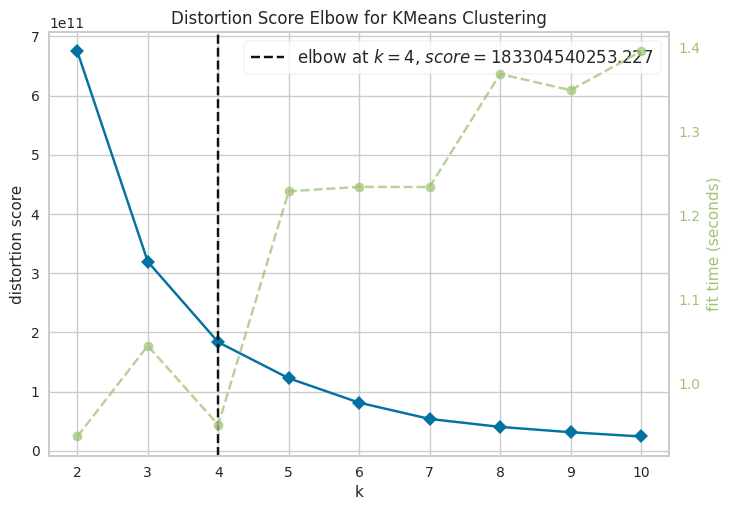

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [26]:
Elbow_M = KElbowVisualizer(KMeans(n_init=10), k=10)
Elbow_M.fit(data)
Elbow_M.show()

Получили, что оптимальное количество кластеров - 4.

## **5.2. Применение K-Means**

Теперь применим сам алгоритм кластризации:

In [27]:
# Масштабируем данные
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Применяем K-Means
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
data['Cluster'] = kmeans.fit_predict(data_scaled)


## **5.3. Визуализация результатов**

Теперь визуализируем полученные кластеры, чтобы понять, насколько хорошо отработал алгоритм. Так как наши данные имеют множество признаков (то есть находятся в высокоразмерном пространстве), а визуализировать данные мы можем максимум в трёхмерном пространстве, то нам придётся воспользоваться алгоритмами уменьшения размерности.

### **5.3.1. Визуализация с использованием PCA**

Воспользуемся алгоритмом уменьшения размерности **PCA (Principal Component Analysis)**. Его работа основывается на том, что он определяет оси наибольшей дисперсии в данных (при этом он выбирает ортогональные оси), называемые главными компонентами, таким образом сохраняя наибольший % информации в данных. Нам нужно будет уменьшить размерность данных до 3, чтобы визуализировать полученные кластеры.

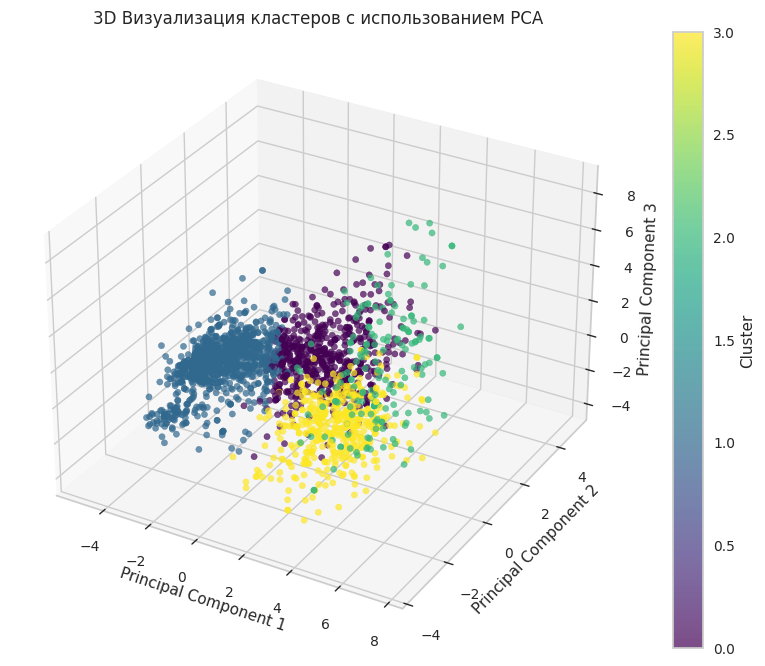

In [28]:
# Уменьшение размерности до 3D для визуализации
pca = PCA(n_components=3)
data_pca = pca.fit_transform(data_scaled)

# Визуализация в 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(data_pca[:, 0], data_pca[:, 1], data_pca[:, 2], 
                     c=data['Cluster'], cmap='viridis', marker='o', alpha=0.7)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
plt.colorbar(scatter, label='Cluster')
plt.title('3D Визуализация кластеров с использованием PCA')
plt.show()

Как видим, вероятно, алгоритм кластеризации отработал хорошо, ведь на картинке видны чёткие и понятные кластеры без смешения и с понятными границами.

### **5.3.2. Визуализация с использованием t-SNE**

Также попробуем визуализировать наши кластеры с использованием **t-SNE**. Этот метод снижения размерности лучше сохраняет локальные структуры данных, хотя и не так хорошо подходит для отображения глобальных отношений. 

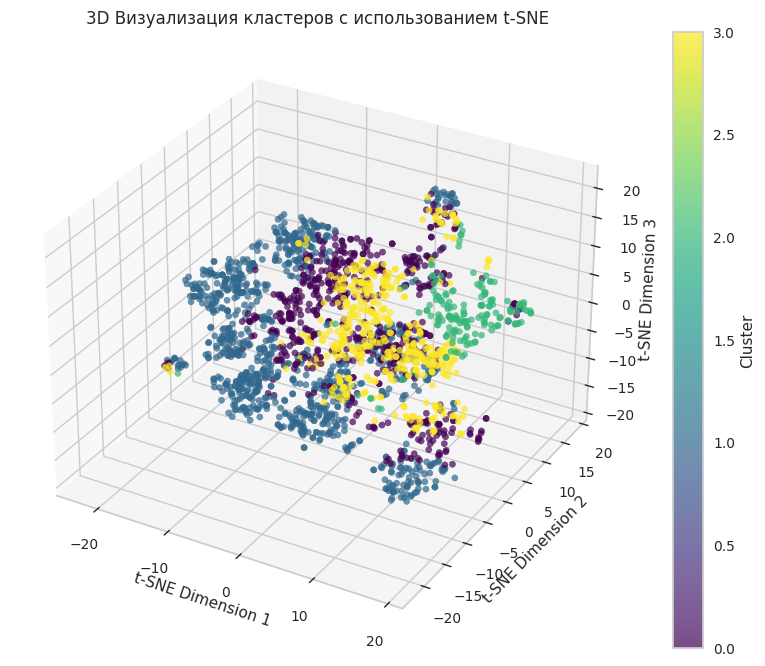

In [29]:
# Снижение размерности с помощью t-SNE до 3D
tsne = TSNE(n_components=3, random_state=42, perplexity=30, n_iter=1000)
data_tsne = tsne.fit_transform(data_scaled)

# Визуализация в 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(data_tsne[:, 0], data_tsne[:, 1], data_tsne[:, 2], 
                     c=data['Cluster'], cmap='viridis', marker='o', alpha=0.7)

ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')
plt.colorbar(scatter, label='Cluster')
plt.title('3D Визуализация кластеров с использованием t-SNE')
plt.show()

Результат визуализации получился совсем непохожим на тот, который был получен с использованием **PCA**, что нормально, ведь эти два метода снижения размерности работают принципиально по-разному. 

С помощью этой визуализации повторно можно удостовериться в том, что были получены адекватные кластеры.

## **5.4. Интерпретация результатов**

### **5.4.1. Определение средних значений признаков**

Посчитаем средние значения признаков по кластерам:

In [30]:
# Рассчитываем средние значения признаков по кластерам
cluster_summary = data.groupby('Cluster').mean()

# Сохраняем в CSV файл
cluster_summary.to_csv('/kaggle/working/cluster_summary.csv')

print(cluster_summary)

               Income   Kidhome  Teenhome    Recency    MntWines  MntFruits  \
Cluster                                                                       
0        57255.328790  0.245315  0.940375  48.051107  462.843271  20.201022   
1        34913.648675  0.789990  0.440628  49.400393   40.377821   5.121688   
2        81983.988095  0.053571  0.130952  49.482143  876.315476  55.863095   
3        74255.006787  0.047511  0.219457  49.217195  488.751131  72.269231   

         MntMeatProducts  MntFishProducts  MntSweetProducts  MntGoldProds  \
Cluster                                                                     
0             131.911414        27.144804         20.877342     59.095400   
1              23.296369         7.343474          5.200196     15.454367   
2             466.589286        76.797619         65.494048     77.607143   
3             431.006787       106.529412         70.902715     76.814480   

         ...        Age  DaysPassedSinceRegistration  Educatio

Визуализируем распределения признаков по кластерам. Это поможет понять, какие характеристики наиболее типичны для каждого кластера.

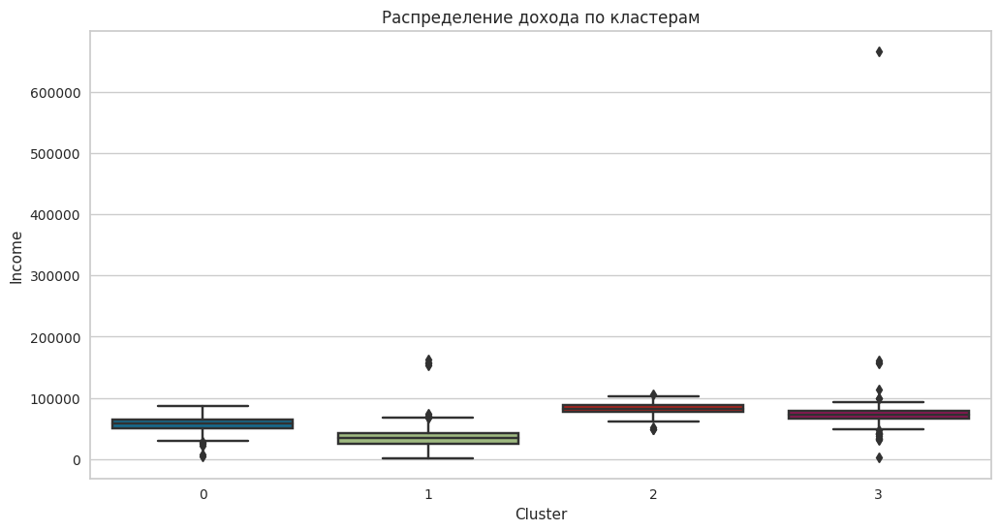

In [31]:
# Визуализация распределения доходов по кластерам
plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Income', data=data)
plt.title('Распределение дохода по кластерам')
plt.show()

### **5.4.2. Создание профилей клиентов для каждого кластера**

На основе средних значений признаков по кластерам можно сформулировать профили клиентов для каждого кластера:

**Кластер 0:**  
- **Доход:** Средний — около 57,255.  
- **Дети:** В среднем у каждого четвёртого есть маленький ребёнок (0.25) и почти у каждого есть один подросток (0.94).  
- **Возраст:** В среднем 59.8 лет.  
- **Покупки:** Основное потребление направлено на вино (463) и мясные продукты (132), низкие расходы на фрукты (20).  
- **Образование:** В среднем бакалавриат/магистратура, но ближе к магистратуре (1.7).  
- **Семейное положение:**  
  - В браке — 39.52%.  
  - Холостые — 15.16%.  
  - Живут вместе — 27.77%.  
  - Разведенные — 13.29%.  
  - Вдовы — 3.75%.  

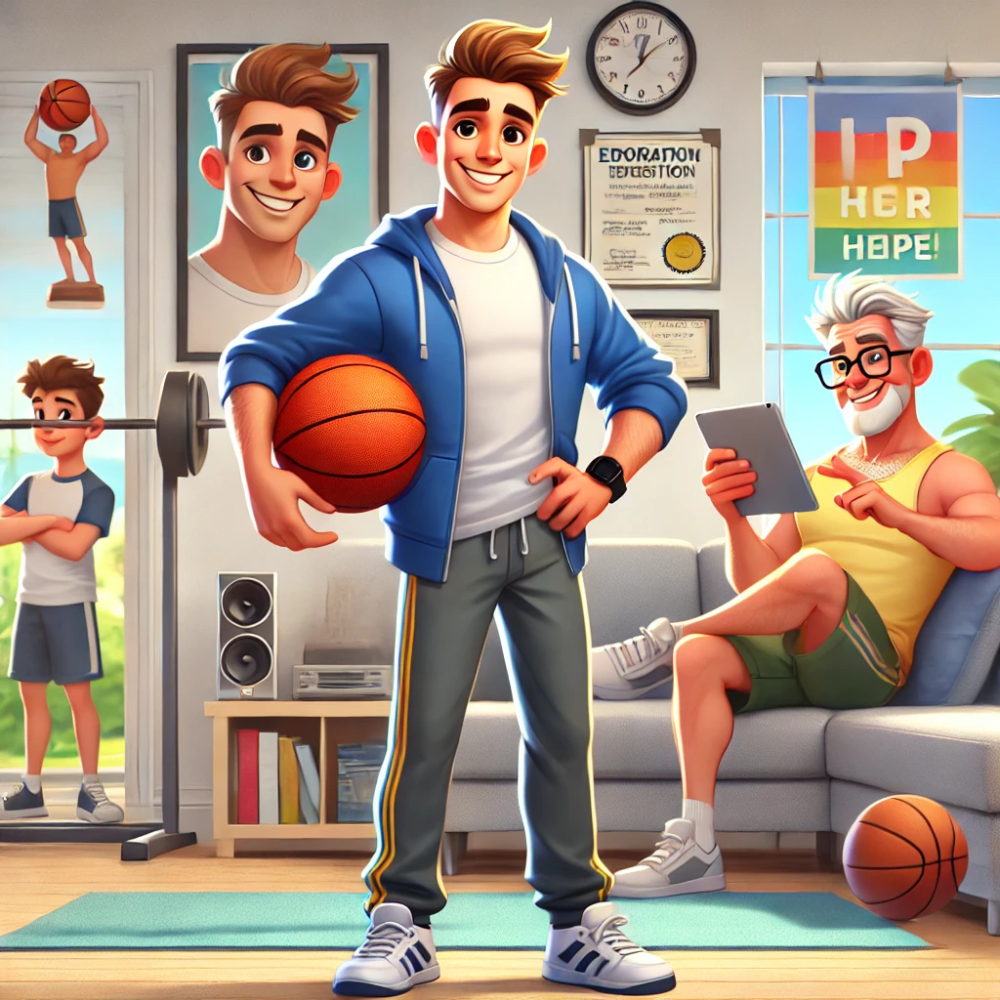 

**Кластер 1:**  
- **Доход:** Низкий — около 34,913.  
- **Дети:** В среднем почти у каждого есть один маленький ребенок (0.79) и почти у каждого второго есть подросток (0.44).  
- **Возраст:** В среднем 52.2 года.  
- **Покупки:** Очень низкие расходы на вино (40), мясные продукты (23), и фрукты (5).  
- **Образование:** В среднем бакалавриат (1.2).  
- **Семейное положение:**  
  - В браке — 39.35%.  
  - Холостые — 23.36%.  
  - Живут вместе — 25.02%.  
  - Разведенные — 9.62%.  
  - Вдовы — 2.45%.

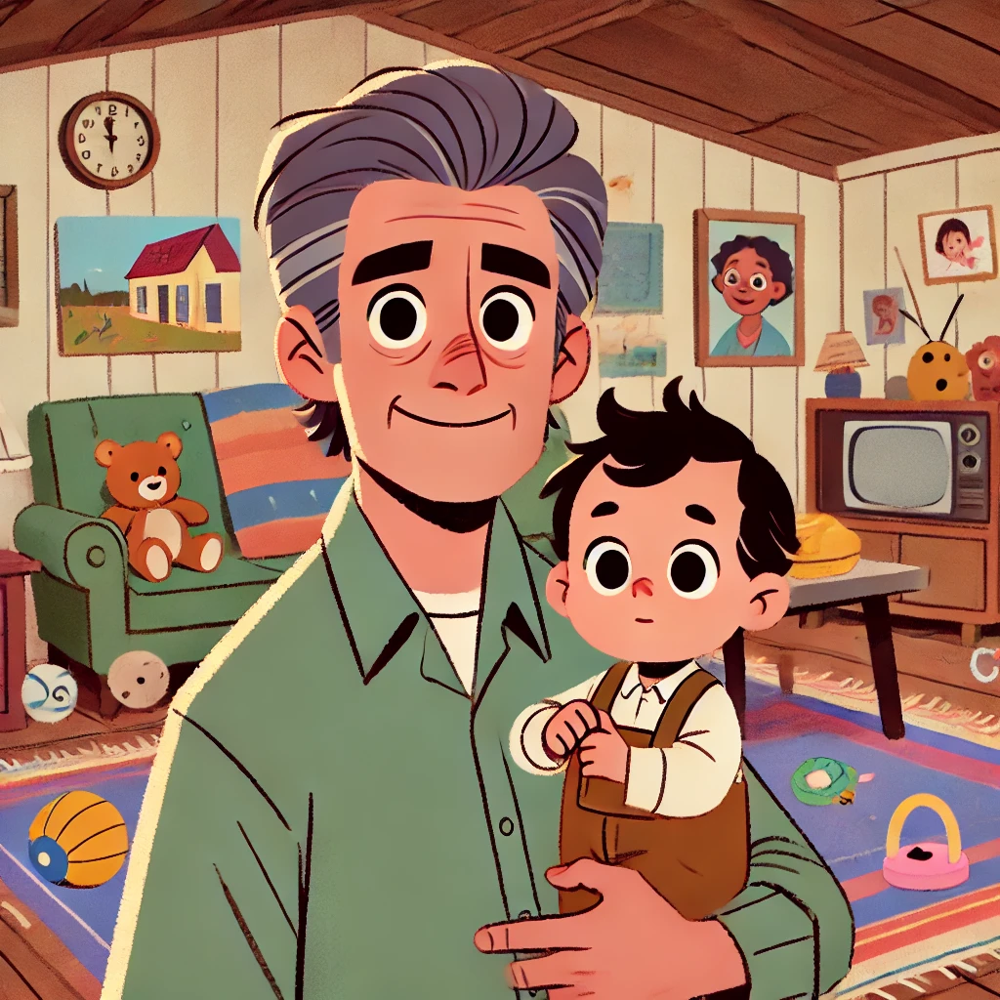 

**Кластер 2:**  
- **Доход:** Высокий — около 81,983.  
- **Дети:** Почти отсутствуют маленькие дети (0.05) и подростки (0.13).  
- **Возраст:** В среднем 54.6 года.  
- **Покупки:** Очень высокие расходы на вино (876) и мясные продукты (467), умеренные на фрукты (56).  
- **Образование:** В среднем бакалавриат/магистратура (1.5).  
- **Семейное положение:**  
  - В браке — 42.26%.  
  - Холостые — 18.45%.  
  - Живут вместе — 26.19%.  
  - Разведенные — 8.33%.  
  - Вдовы — 4.17%.  

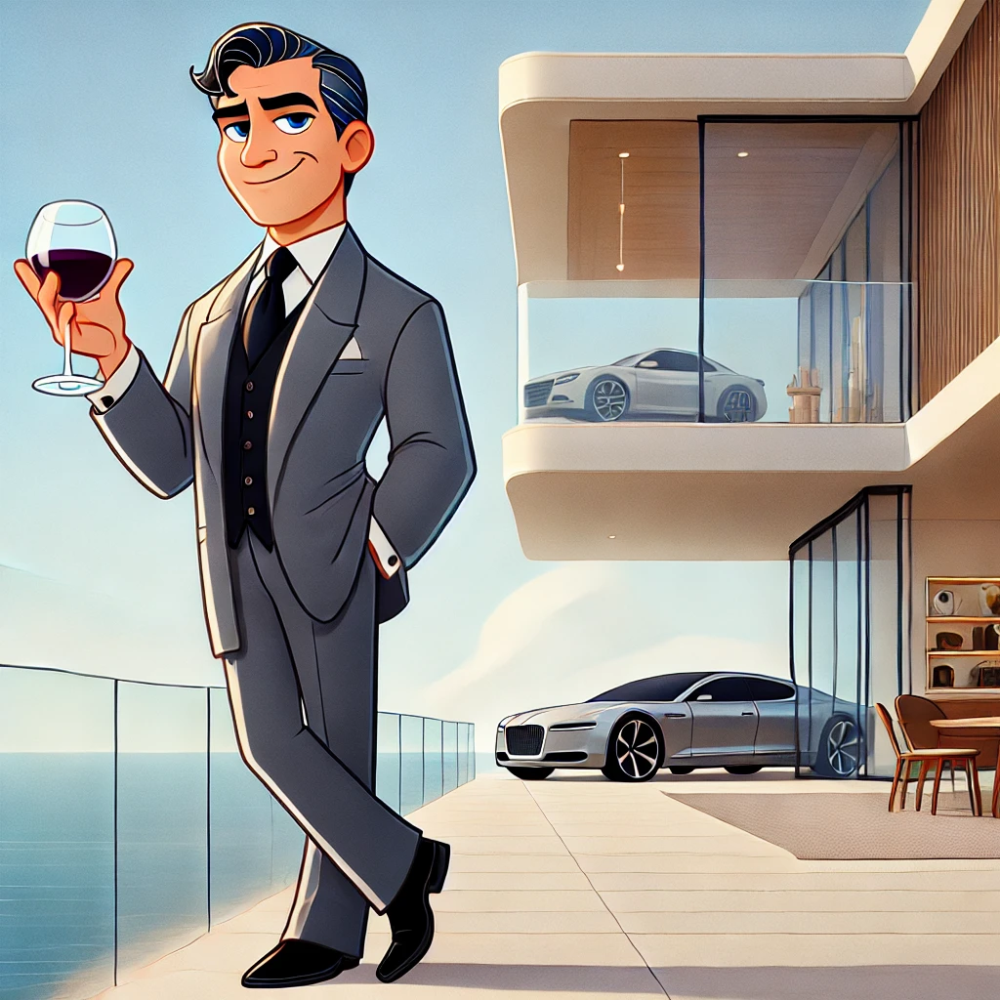 

**Кластер 3:**  
- **Доход:** Высокий — около 74,255.  
- **Дети:** Практически отсутствуют дети (0.05), подросток есть в среднем только у каждого пятого (0.22).  
- **Возраст:** В среднем 56 лет.  
- **Покупки:** Высокие расходы на вино (489) и мясные продукты (431), умеренные на фрукты (72).  
- **Образование:** В среднем бакалавриат (1.3).  
- **Семейное положение:**  
  - В браке — 34.62%.  
  - Холостые — 25.57%.  
  - Живут вместе — 25.11%.  
  - Разведенные — 9.50%.  
  - Вдовы — 4.78%.

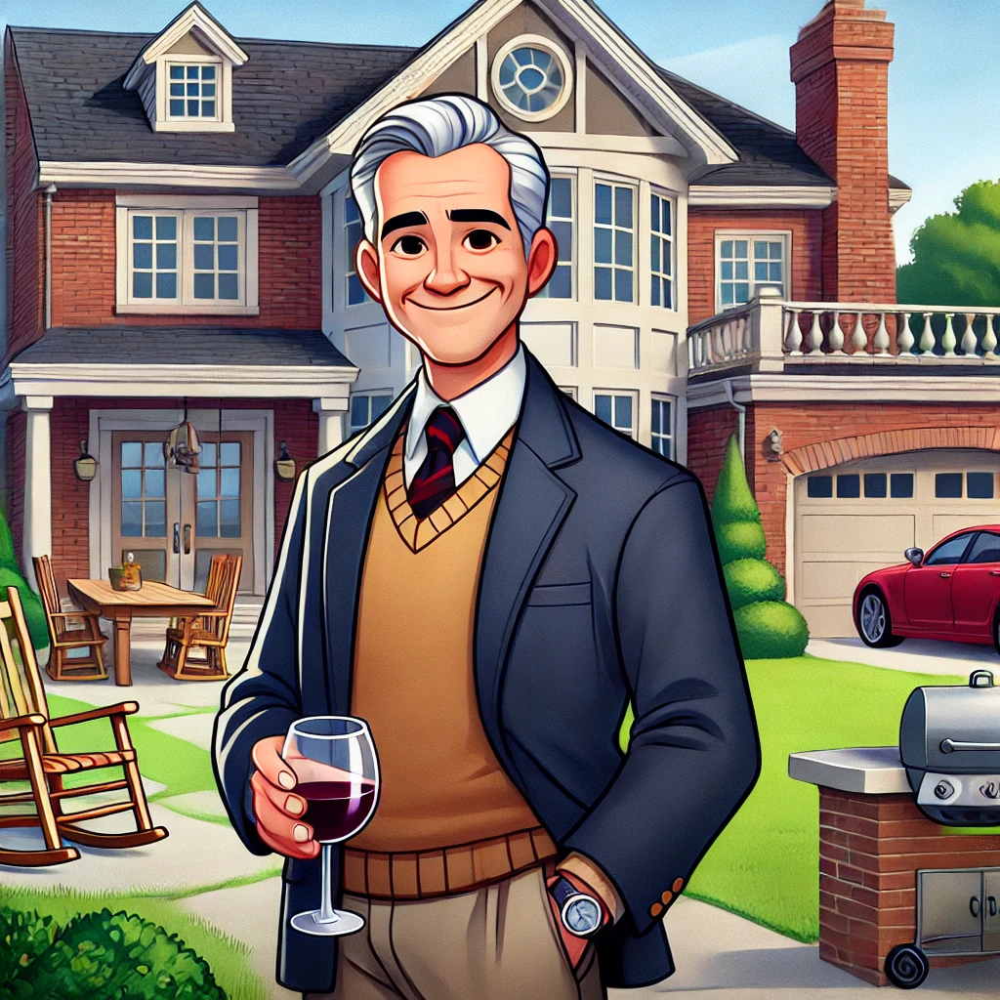 

*Изображения сгенерированы ИИ, при этом они отражают отличительные черты кластеров*

---

# **6. Заключение**

## **6.1. Основные результаты исследования**

### **6.1.1. Предварительная обработка данных**

* Проведена очистка данных от пропусков и дубликатов.
* Выполнено кодирование категориальных признаков.
* Обработаны выбросы.

### **6.1.2. Исследовательский анализ данных**

* Проанализированы распределения признаков.
* Выявлены корреляционные связи между характеристиками клиентов.
* Проведен групповой анализ по различным признакам.

### **6.1.3. Проверка гипотез**

Подтверждены следующие гипотезы:

* Влияние дохода на онлайн-покупки.
* Связь наличия детей с откликом на маркетинговые кампании.
* Зависимость трат от возраста клиентов.

### **6.1.4. Кластеризация**

* Определено оптимальное число кластеров.
* Проведена кластеризация методом K-Means.
* Визуализированы результаты с помощью PCA и t-SNE.
* Созданы профили клиентов для каждого кластера.

## **6.2. Достижение целей исследования**

Все поставленные цели исследования были успешно достигнуты:

* Изучены взаимосвязи между социально-демографическими характеристиками и покупательским поведением.
* Проверены гипотезы о факторах, влияющих на поведение клиентов.
* Проведена сегментация клиентов с помощью кластеризации и созданы профили клиентов.

## **6.3. Практическая ценность результатов**

Полученные результаты можно использовать для:

* Разработки персонализированных маркетинговых стратегий.
* Таргетирования маркетинговых кампаний.
* Прогнозирования поведения клиентов.
* Оптимизации каналов продаж.

## **6.4. Перспективы дальнейших исследований**

1. Применение более продвинутых методов машинного обучения.
2. Расширение набора признаков.
3. Разработка предиктивных моделей поведения клиентов.
4. Углубленное изучение выявленных кластеров.

Разработанный подход демонстрирует эффективность комплексного анализа данных для понимания клиентского поведения и может быть масштабирован и адаптирован для различных бизнес-задач.